# **Tuberculosis detection from chest x-ray images using CNN**

# 1. Data Preprocessing

In [1]:
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt

RGB
(512, 512)


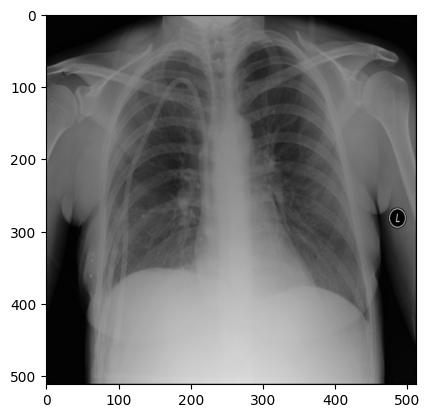

RGB
(512, 512)


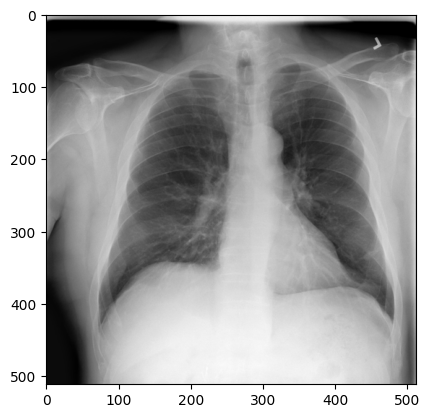

RGB
(512, 512)


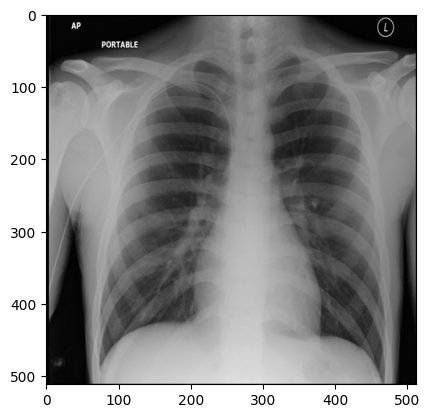

RGB
(512, 512)


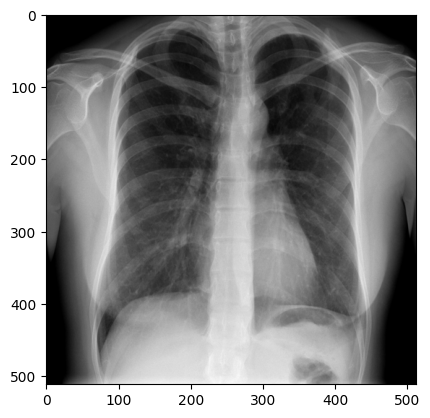

In [2]:
# range(start, stop, step)
for i in range(1,5):
    image = Image.open(
        f'../input/tuberculosis-tb-chest-xray-dataset/TB_Chest_Radiography_Database/Normal/Normal-{i}.png')
    print(image.mode)
    print(image.size)
    plt.imshow(image)
    plt.show()

## 1.1. Data Transforming

In [3]:
import numpy as np
from numpy import asarray
import os
from tqdm import tqdm

In [4]:
dir_path = '../input/tuberculosis-tb-chest-xray-dataset/TB_Chest_Radiography_Database/'

In [5]:
def numpize(subset: str, img_size=(128, 128), grayscale=False):
    """
    Convert a set of images from a specified subset to NumPy arrays.

    Parameters:
    - subset (str): Specifies the subset of images, e.g., 'Normal' or 'Tuberculosis'.
    - img_size (tuple): Tuple representing the desired size of the images after resizing.
    - grayscale (bool): If True, convert images to grayscale.

    Returns:
    - numpy_array (numpy.ndarray): NumPy array containing the transformed images.
    """
    image_dir = f'{dir_path}/{subset}/'
    image_files = os.listdir(image_dir)
    image_count = len(image_files)
    transformed_images = []

    for i in tqdm(range(1, image_count + 1), desc='Transforming...'):
        image_path = f'{image_dir}/{subset}-{i}.png'
        image = Image.open(image_path)

        # Ensure all images are in the same format
        if grayscale:
            image = image.convert('L')  # Convert to grayscale
        else:
            image = image.convert('RGB')  # Convert to RGB

        # Resize all images to the specified size without padding
        resized_image = image.resize(img_size)
        data = np.asarray(resized_image)
        transformed_images.append(data)

    numpy_array = np.array(transformed_images)
    return numpy_array

### Normal

In [6]:
norm = numpize(subset='Normal', 
               img_size=(128, 128), 
               grayscale=False)
norm.shape

Transforming...: 100%|██████████| 3500/3500 [01:16<00:00, 45.77it/s]


(3500, 128, 128, 3)

### Tuberculosis

In [7]:
tb = numpize(subset='Tuberculosis', 
             img_size=(128, 128), 
             grayscale=False)
tb.shape

Transforming...: 100%|██████████| 700/700 [00:13<00:00, 53.74it/s]


(700, 128, 128, 3)

## 1.2. Target

In [8]:
target_norm = np.zeros(norm.shape[0])
print(f'Shape: {target_norm.shape[0]}, array: {target_norm}')

Shape: 3500, array: [0. 0. 0. ... 0. 0. 0.]


In [9]:
target_tb = np.ones(tb.shape[0])
print(f'Shape: {target_tb.shape[0]}, array: {target_tb}')

Shape: 700, array: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1

In [10]:
def show_image(images, target, title, num_display=16, num_cols=4, cmap='gray', random_mode=False):
    '''
    :Parameters
        images (ndarray (n,)): Input data as a numpy array.
        target (ndarray (n,)): Target data as a numpy array.
        title (String): Title of the plot.
        num_display (int): Number of images to display. Default is 16.
        num_cols (int): Number of columns in the plot. Default is 4.
        cmap (str): Color map for displaying images. Default is 'gray'.
        random_mode (bool): If True, display images randomly. If False, display the first num_display images. Default is False.
    '''
    # Determine the number of rows based on the num_cols parameter
    n_cols = min(num_cols, num_display)
    n_rows = int(np.ceil(num_display / n_cols))

    n_images = min(num_display, len(images))
    if random_mode:
        random_indices = np.random.choice(
            len(images), num_display, replace=False)
    else:
        random_indices = np.arange(num_display)

    fig, axes = plt.subplots(
        nrows=n_rows, ncols=n_cols, figsize=(20, 4*n_rows))
    for i, ax in enumerate(axes.flatten()):
        if i >= n_images:  # Check if the index exceeds the available number of images
            break
        # Incase (Did PCA)
        index = random_indices[i]
        if len(images.shape) == 2:
            image = images[index].reshape((128, 128)).astype(int)
        else:
            image = images[index]

        ax.imshow(image, cmap=cmap)
        ax.set_title("Target: {}".format(target[index]))

        # Add image index as text
        ax.text(0.5, -0.15, f'Image Index: {index}', transform=ax.transAxes,
                fontsize=10, ha='center')

    plt.suptitle(f"{title} (Displaying {num_display} Images)",
                 fontsize=16, fontweight='bold')

    fig.set_facecolor('white')
    plt.tight_layout() 
    return plt.show()

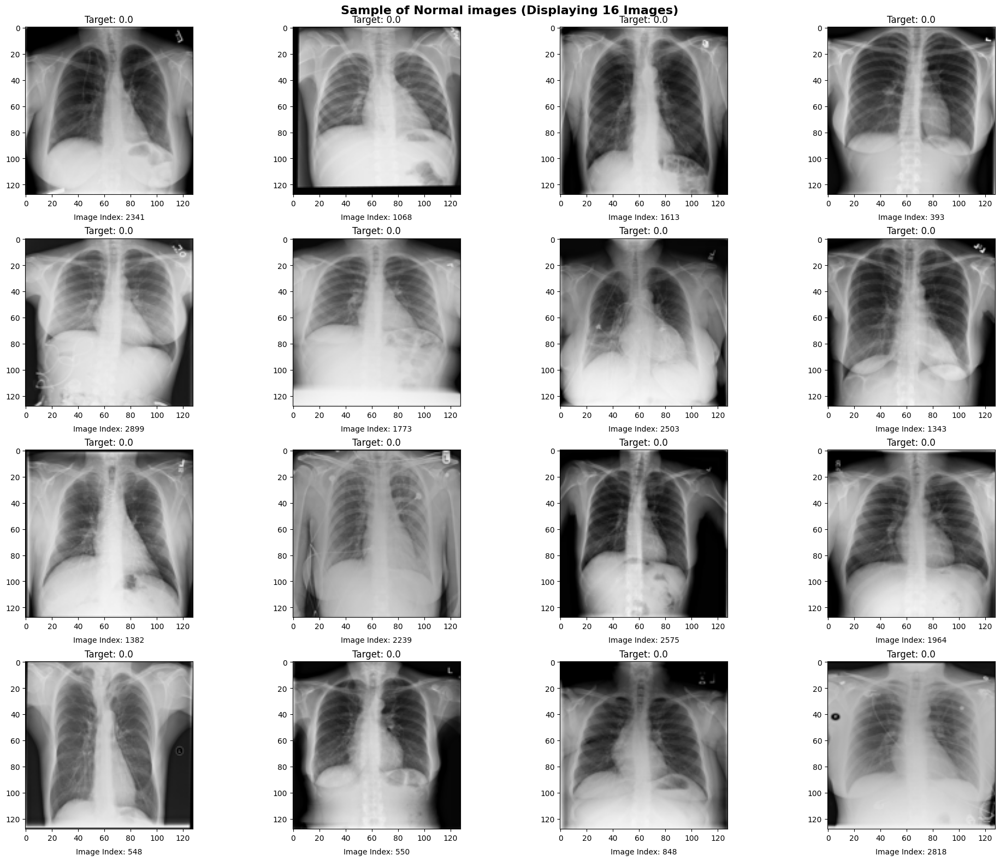

In [11]:
show_image(images=norm, 
           target=target_norm,
           title='Sample of Normal images',
           num_display=16, 
           num_cols=4, 
           cmap='gray', 
           random_mode=True)

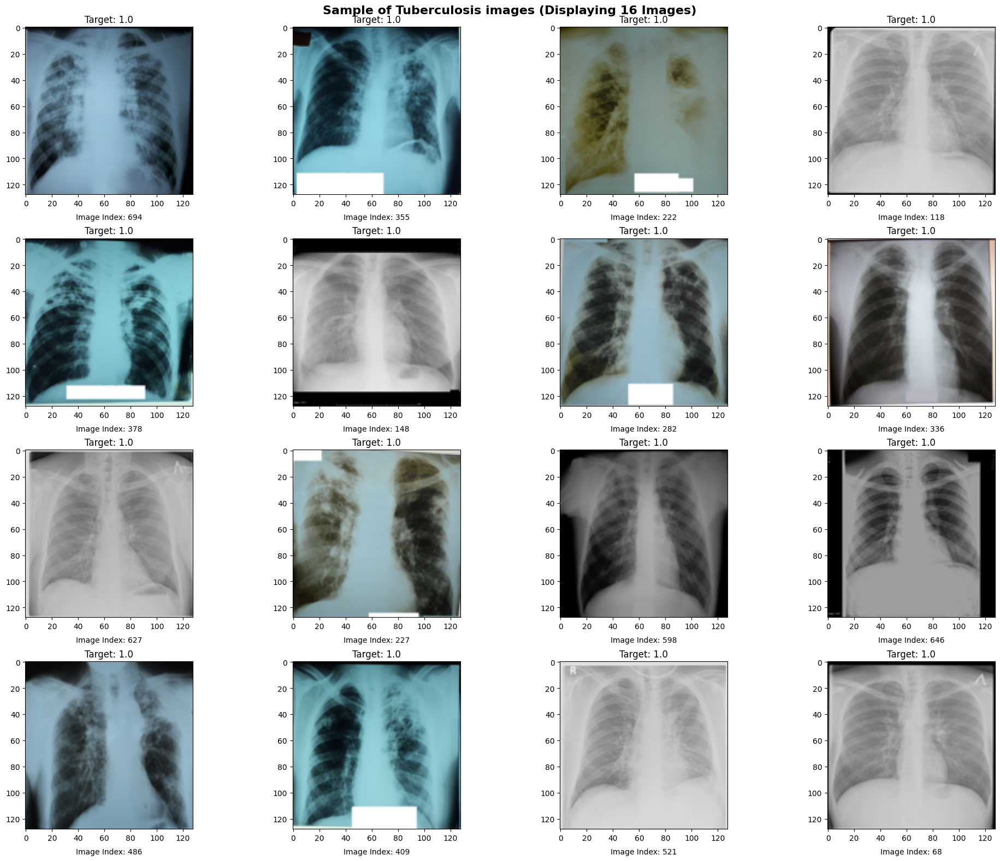

In [12]:
show_image(images=tb, 
           target=target_tb,
           title='Sample of Tuberculosis images',
           num_display=16, 
           num_cols=4, 
           cmap='gray', 
           random_mode=True)

## 1.3. Data Augmentation (Class imbalance problem) (Optional):

In [13]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import random

In [14]:
def x_ray_image_augmentation(images, targets, sample_count):
    '''
    :Parameters
        df (ndarray (n,)): Input data as a numpy array.
        target (ndarray (n,)): Target data as a numpy array.
        sample_count (integer64): Number of data needed.
    '''

    # Randomize the data augmentation parameters
    rotation_range = random.randint(-5, 5)
    # width_shift_range = random.uniform(0.0, 0.05)      Not reccomend
    # height_shift_range = random.uniform(0.0, 0.05)     Not reccomend
    # shear_range = random.uniform(0.0, 0.1)             Not reccomend
    zoom_range = random.uniform(0.0, 0.1)
    fill_mode = random.choice(['nearest',
                               'constant',
                               #    'reflect',               Not reccomend
                               'wrap'])

    # Create the ImageDataGenerator with randomized parameters
    datagen = ImageDataGenerator(
        rotation_range=rotation_range,
        # width_shift_range=width_shift_range,             Not reccomend
        # height_shift_range=height_shift_range,           Not reccomend
        # shear_range=shear_range,                         Not reccomend
        zoom_range=zoom_range,
        fill_mode=fill_mode
    )
    # Load and augment the data

    augmented_data_generator = datagen.flow(images, targets, batch_size=1)
    batch_images, batch_labels = next(augmented_data_generator)
    for _ in tqdm(range(sample_count), desc='augmenting...'):
        batch_images, batch_labels = next(augmented_data_generator)#.next()
        try:
            combined_images = np.concatenate(
                (combined_images, batch_images), axis=0)
            combined_labels = np.concatenate(
                (combined_labels, batch_labels), axis=0)
        except NameError:
            combined_images = np.concatenate((images, batch_images), axis=0)
            combined_labels = np.concatenate((targets, batch_labels), axis=0)
    '''
    Returns:
        combined_images (ndarray (n,)) : generated images
        combined_labels (ndarray (n,)) : generated labels
    '''

    return combined_images, combined_labels


In [15]:
# Scaled the dataset before do Augmentation 
norm = norm/255
tb = tb/255

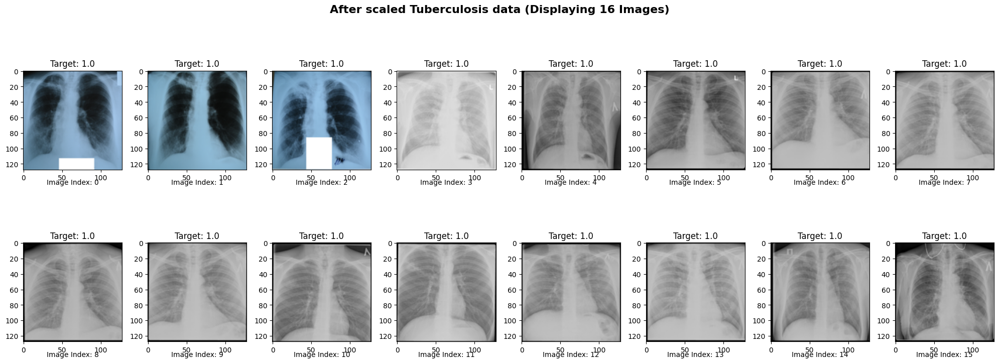

In [16]:
show_image(images=tb,
           target=target_tb,
           title='After scaled Tuberculosis data', 
           num_display=16, 
           num_cols=8, 
           cmap='gray', 
           random_mode=False)

In [17]:
tb_augmented, target_tb_augmented = x_ray_image_augmentation(images=tb, 
                                                             targets=target_tb, 
                                                             sample_count=2800)

augmenting...: 100%|██████████| 2800/2800 [14:43<00:00,  3.17it/s]


In [18]:
tb_augmented.shape

(3500, 128, 128, 3)

In [19]:
print(
    f'Before {tb.shape[0]}\nAfter Data Augmentation {tb_augmented.shape[0]}\n+{tb_augmented.shape[0]-tb.shape[0]} Training examples')

Before 700
After Data Augmentation 3500
+2800 Training examples


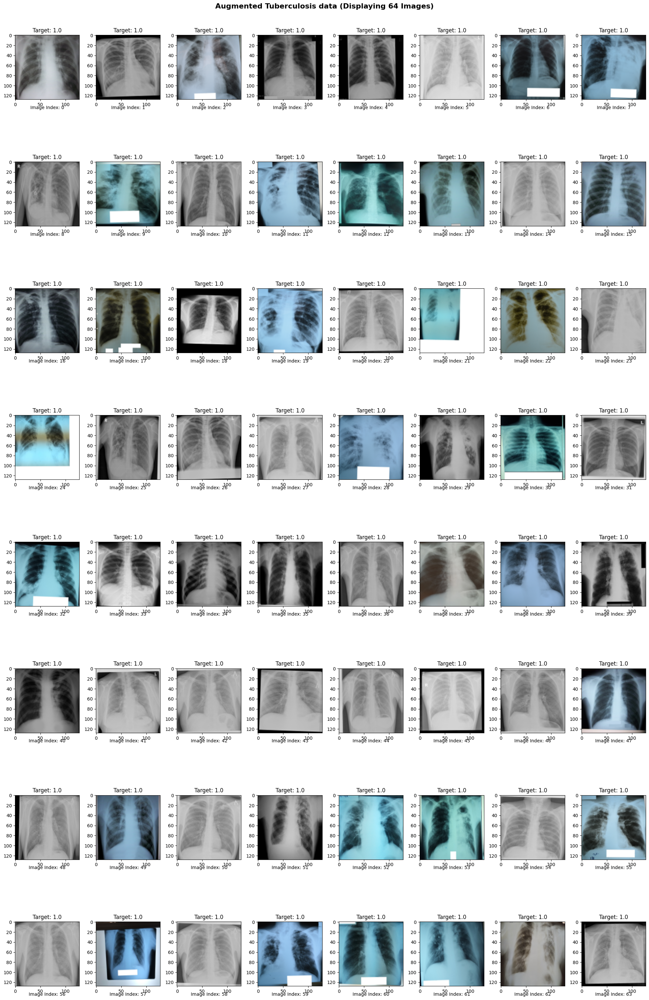

In [20]:
# Start index since 700 to last to observe to new training images
show_image(images=tb_augmented[700:-1],
           target=target_tb_augmented[700:-1],
           title='Augmented Tuberculosis data', 
           num_display=64, 
           num_cols=8, 
           cmap='gray', 
           random_mode=False)

## 1.4. Data Preparation

In [21]:
# Concatenate df_norm and df_tb along the first axis (samples)
X = np.concatenate((norm, tb_augmented), axis=0)

# Concatenate target_norm and target_tb
y = np.concatenate((target_norm,  target_tb_augmented), axis=0)

In [22]:
X.shape

(7000, 128, 128, 3)

In [23]:
y.shape

(7000,)

In [24]:
import pandas as pd

In [25]:
y_df = pd.DataFrame(y)
y_df.value_counts()

0  
0.0    3500
1.0    3500
Name: count, dtype: int64

# 2. CNN

In [26]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, AveragePooling2D, Flatten, Dropout, Dense

In [27]:
class CNN:
    def __init__(self, 
                 input_shape=(128, 128, 3), 
                 unit_size_rate=0.05, 
                 conv_padding='same', 
                 conv_kernel_size=(3, 3),
                 conv_stride=1, 
                 pool_padding='same', 
                 pool_kernel_size=(2, 2), 
                 pool_stride=2, 
                 dropout=0, 
                 l1_lambda=None,
                 l2_lambda=None, 
                 pooling_type='max', 
                 epochs=5, 
                 batch_size=64, 
                 verbose=1):
        self.input_shape = input_shape
        self.unit_size_rate = unit_size_rate
        self.conv_padding = conv_padding
        self.conv_kernel_size = conv_kernel_size
        self.conv_stride = conv_stride
        self.pool_padding = pool_padding
        self.pool_kernel_size = pool_kernel_size
        self.pool_stride = pool_stride
        self.dropout = dropout
        self.l1_lambda = l1_lambda
        self.l2_lambda = l2_lambda
        self.pooling_type = pooling_type
        self.epochs = epochs
        self.batch_size = batch_size
        self.verbose = verbose
        self.model = self.build_model()

    def build_model(self):
        reg_l1 = None
        reg_l2 = None

        if self.l1_lambda is not None:
            reg_l1 = tf.keras.regularizers.l1(self.l1_lambda)

        if self.l2_lambda is not None:
            reg_l2 = tf.keras.regularizers.l2(self.l2_lambda)

        if len(self.input_shape) == 2:
            # Add color channel for grayscale images
            self.input_shape = self.input_shape + (1,)

        model = Sequential()
        model.add(Conv2D(
            int(32 * self.unit_size_rate),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            activation='relu',
            kernel_regularizer=reg_l1,
            input_shape=self.input_shape))

        if self.pooling_type == 'max':
            model.add(MaxPooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        elif self.pooling_type == 'avg':
            model.add(AveragePooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        else:
            raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

        model.add(Conv2D(
            int(64 * self.unit_size_rate),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            kernel_regularizer=reg_l2,
            activation='relu'))

        if self.pooling_type == 'max':
            model.add(MaxPooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        elif self.pooling_type == 'avg':
            model.add(AveragePooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        else:
            raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

        model.add(Conv2D(
            int(128 * self.unit_size_rate),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            kernel_regularizer=reg_l2,
            activation='relu'))

        if self.pooling_type == 'max':
            model.add(MaxPooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        elif self.pooling_type == 'avg':
            model.add(AveragePooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        else:
            raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

        model.add(Flatten())
        model.add(Dense(
            units=int(128 * self.unit_size_rate),
            activation='relu',
            kernel_regularizer=reg_l2))

        model.add(Dropout(self.dropout))
        model.add(Dense(units=1, activation='sigmoid'))
        model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
        return model

    def predict(self, X, threshold=0.5, verbose=0):
        return (self.model.predict(X, verbose=verbose) > threshold).astype("int32")

    def summary(self):
        self.model.summary()

    def train(self, X_train, y_train, X_val, y_val, epochs, batch_size, verbose=1):
        history = self.model.fit(
            X_train, y_train,
            batch_size=batch_size if batch_size else self.batch_size,
            epochs=epochs if epochs else self.epochs,
            verbose=verbose,
            validation_data=(X_val, y_val)
        )
        return history

In [28]:
cnn = CNN(unit_size_rate=1,
          input_shape=(128,128,3))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [29]:
cnn.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     4,194,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,287,809 (16.36 MB)

 Trainable params: 4,287,809 (16.36 MB)

 Non-trainable params: 0 (0.00 B)

# 3. Splitting the Dataset:

Splitting the dataset into training, validation, and test sets. The usual split ratios are 
- 80% for training, 
- 10% for validation, 
- and 10% for testing. 

In [30]:
from sklearn.model_selection import train_test_split

In [31]:
def viz_class_distribution(X, y, title, classe_labels, train_percent=0.6, val_percent=0.2, test_percent=0.2):
    '''
    :Parameters:
    - X (numpy array): The input feature matrix of shape (num_examples, num_features).
    - y (numpy array): The target labels of shape (num_examples,).
    - title (str): The title for the entire plot.
    - classes (list): A list of class labels, e.g., ['Normal', 'Tuberculosis'].
    - train_percent (float): Percentage of data for training set.
    - val_percent (float): Percentage of data for validation set.
    - test_percent (float): Percentage of data for test set.

    :Returns:
    - X_train, y_train, X_test, y_test, X_val, y_val: The subsets of the data.
    '''
    assert train_percent + val_percent + test_percent == 1.0, "Sum of train_percent, val_percent, and test_percent should be 1.0"

    # Convert y to integers
    y = y.astype(int)

    # Split the data
    X_train, X_temp, y_train, y_temp = train_test_split(
        X, y, test_size=val_percent + test_percent, random_state=42, stratify=y)

    test_size = test_percent / (val_percent + test_percent)
    X_val, X_test, y_val, y_test = train_test_split(
        X_temp, y_temp, test_size=test_size, random_state=42, stratify=y_temp)

    # Create a subplot with 3 columns and 1 row
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    # List of subset names
    subset_names = ['Train', 'Test', 'Validation']
    n = len(X)

    # Iterate over subsets
    for i, subset in enumerate([(X_train, y_train), (X_test, y_test), (X_val, y_val)]):
        X_subset, y_subset = subset
        n_subset = len(y_subset)
        # Get the class counts
        class_counts = np.bincount(y_subset)

        # Plot histogram for the current subset
        axs[i].bar(classe_labels, class_counts, color='#AA99FF')
        subtitle = r'$\bf{' + subset_names[i] + \
            '}$' + f' {int(n_subset/n*100)} %'
        axs[i].set_title(
            subtitle + f'\n Size = {X_subset.shape[0]}', fontsize=18)
        axs[i].set_xlabel('Class')
        axs[i].set_ylabel('Number of examples')

        # Add labels to the bars
        for j, count in enumerate(class_counts):
            axs[i].text(j, count, str(count), ha='center',
                        va='bottom', fontsize=12)

    class_counts = np.bincount(y)
    class_balance_text = ' | '.join(
        [f'{class_label} ({count})' for class_label, count in zip(classe_labels, class_counts)])
    plt.suptitle(f'{title}' + f'\n Training examples (X): {X.shape[0]}' +
                 f'\nTarget (y): {class_balance_text}', fontsize=20)

    plt.tight_layout()
    plt.show()

    return X_train, y_train, X_test, y_test, X_val, y_val

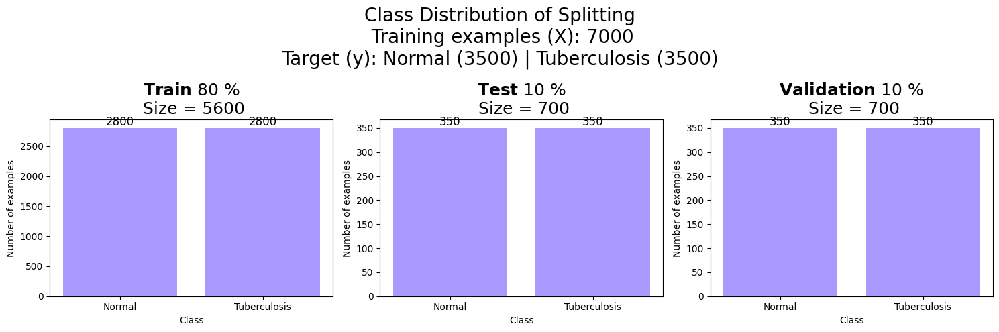

In [32]:
X_train, y_train, X_test, y_test, X_val, y_val = viz_class_distribution(X=X, 
                        y=y, 
                        title='Class Distribution of Splitting', 
                        classe_labels=['Normal', 'Tuberculosis'], 
                        train_percent=0.8, 
                        val_percent=0.1, 
                        test_percent=0.1)

# 4. Modeling

In [33]:
model_config = {
    # (height, width, channels)
    'input_shape': (128, 128,3),
    'unit_size_rate': 0.05,
    'l1_lambda': None,
    'l2_lambda': None,

    'conv_padding': 'same',
    'conv_kernel_size': (3, 3),
    'conv_stride': 1,

    'pool_padding': 'same',
    'pool_kernel_size': (2, 2),
    'pool_stride': 2,
    
    'dropout': 0,
    'pooling_type': 'max'
}

# Build model
model_1st = CNN(**model_config).build_model()
model_1st.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 128, 128, 1)    │            28 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 64, 64, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 64, 64, 3)      │            30 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 32, 32, 6)      │           168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 16, 16, 6)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 1536)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 6)              │         9,222 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 6)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │             7 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,455 (36.93 KB)

 Trainable params: 9,455 (36.93 KB)

 Non-trainable params: 0 (0.00 B)

In [34]:
import time

In [35]:
optimizer = tf.keras.optimizers.Adam()
optimizer_config= optimizer.get_config()
optimizer_config

{'name': 'adam',
 'learning_rate': 0.0010000000474974513,
 'weight_decay': None,
 'clipnorm': None,
 'global_clipnorm': None,
 'clipvalue': None,
 'use_ema': False,
 'ema_momentum': 0.99,
 'ema_overwrite_frequency': None,
 'loss_scale_factor': None,
 'gradient_accumulation_steps': None,
 'beta_1': 0.9,
 'beta_2': 0.999,
 'epsilon': 1e-07,
 'amsgrad': False}

In [36]:
start_time = time.time()
# verbose is progress bar; verbose = 1 display, verbose = don't display 
verbose = 1
# Compile the model
model_1st.compile(loss='binary_crossentropy',
                   optimizer=optimizer,
                   metrics=['accuracy'])

# Train the model
history = model_1st.fit(X_train, y_train, 
                             epochs=30,
                             batch_size=64,
                             validation_data=(X_val, y_val),
                             verbose=verbose)

end_time = time.time()
training_time = end_time - start_time
training_time

Epoch 1/30
88/88 ━━━━━━━━━━━━━━━━━━━━ 23s 234ms/step - accuracy: 0.7063 - loss: 0.6082 - val_accuracy: 0.9157 - val_loss: 0.2239
Epoch 2/30
88/88 ━━━━━━━━━━━━━━━━━━━━ 16s 185ms/step - accuracy: 0.8979 - loss: 0.2498 - val_accuracy: 0.9200 - val_loss: 0.2041
Epoch 3/30
88/88 ━━━━━━━━━━━━━━━━━━━━ 21s 196ms/step - accuracy: 0.9237 - loss: 0.1975 - val_accuracy: 0.9457 - val_loss: 0.1490
Epoch 4/30
88/88 ━━━━━━━━━━━━━━━━━━━━ 17s 187ms/step - accuracy: 0.9318 - loss: 0.1769 - val_accuracy: 0.9214 - val_loss: 0.1984
Epoch 5/30
88/88 ━━━━━━━━━━━━━━━━━━━━ 17s 197ms/step - accuracy: 0.9358 - loss: 0.1673 - val_accuracy: 0.9500 - val_loss: 0.1326
Epoch 6/30
88/88 ━━━━━━━━━━━━━━━━━━━━ 16s 186ms/step - accuracy: 0.9322 - loss: 0.1797 - val_accuracy: 0.9514 - val_loss: 0.1355
Epoch 7/30
88/88 ━━━━━━━━━━━━━━━━━━━━ 21s 189ms/step - accuracy: 0.9476 - loss: 0.1458 - val_accuracy: 0.9586 - val_loss: 0.1181
Epoch 8/30
88/88 ━━━━━━━━━━━━━━━━━━━━ 21s 195ms/step - accuracy: 0.9422 - loss: 0.1548 - val_accu

555.874990940094

In [37]:
print(f'Training time in minutes: {training_time/60:.2f} minutes')

Training time in minutes: 9.26 minutes


In [38]:
get_config = {
            'Optimizer parameters Configuration': {
                'optimizer_name': optimizer_config['name'],
                'learning_rate': optimizer_config['learning_rate'],
                'beta1': optimizer_config['beta_1'],
                'beta2': optimizer_config['beta_2'],
                'epsilon': optimizer_config['epsilon'],
            },
            'Hyperparameters Configuration': {
                'conv_padding': model_config['conv_padding'],
                'conv_kernel_size': model_config['conv_kernel_size'],
                'conv_stride': model_config['conv_stride'],
                'pool_padding': model_config['pool_padding'],
                'pool_kernel_size': model_config['pool_kernel_size'],
                'pool_stride': model_config['pool_stride'],
                'pooling_type': model_config['pooling_type'],
            },
            'Model Architecture Configuration': {
                'input_shape': model_config['input_shape'],
                'unit_size_rate': model_config['unit_size_rate']
            },
            'Model Training Configuration': {
                'batch_size': 20,
                'epoch': 64
            },
        }
get_config

{'Optimizer parameters Configuration': {'optimizer_name': 'adam',
  'learning_rate': 0.0010000000474974513,
  'beta1': 0.9,
  'beta2': 0.999,
  'epsilon': 1e-07},
 'Hyperparameters Configuration': {'conv_padding': 'same',
  'conv_kernel_size': (3, 3),
  'conv_stride': 1,
  'pool_padding': 'same',
  'pool_kernel_size': (2, 2),
  'pool_stride': 2,
  'pooling_type': 'max'},
 'Model Architecture Configuration': {'input_shape': (128, 128, 3),
  'unit_size_rate': 0.05},
 'Model Training Configuration': {'batch_size': 20, 'epoch': 64}}

In [39]:
def get_history(history,
                model,
                training_time:float, 
                ref_name:str, 
                title:str):

        best_epoch = np.argmax(history.history['val_accuracy'])
        best_train_epoch = np.argmax(history.history['accuracy'])

        # Create a 1x2 grid of subplots
        fig, axes = plt.subplots(1, 2, figsize=(24, 15))

        # Plot training and validation accuracy
        axes[0].plot(history.epoch, history.history['accuracy'],
                     label='Train Accuracy')
        axes[0].plot(history.epoch, history.history['val_accuracy'],
                     label='Validation Accuracy')
        axes[0].scatter(best_epoch, history.history['val_accuracy']
                        [best_epoch], color='r', label='Best Epoch (Validation)')
        axes[0].scatter(best_train_epoch, history.history['accuracy']
                        [best_train_epoch], color='g', label='Best Epoch (Train)')

        # Annotate the best validation accuracy point
        best_accuracy = history.history['val_accuracy'][best_epoch]
        random_offset_x = 10
        random_offset_y = np.random.randint(-30, 30)
        axes[0].annotate(f'{best_accuracy:.3f}',
                         xy=(best_epoch, best_accuracy),
                         xytext=(random_offset_x, random_offset_y),
                         textcoords='offset points',
                         arrowprops=dict(arrowstyle='->'))

        axes[0].set_xlabel('Epoch')
        axes[0].set_ylabel('Accuracy (%)')
        axes[0].set_title('Training and Validation Accuracy')
        axes[0].legend()

        # Annotate the best training accuracy point
        best_train_accuracy = history.history['accuracy'][best_train_epoch]
        random_offset_y = np.random.randint(-30, 30)
        axes[0].annotate(f'{best_train_accuracy:.3f}',
                         xy=(best_train_epoch, best_train_accuracy),
                         xytext=(random_offset_x, random_offset_y),
                         textcoords='offset points',
                         arrowprops=dict(arrowstyle='->'))

        # Plot training and validation loss
        axes[1].plot(history.epoch,
                    history.history['loss'], label='Train Loss')
        axes[1].plot(history.epoch, history.history['val_loss'],
                     label='Validation Loss')
        axes[1].scatter(best_epoch, history.history['val_loss']
                        [best_epoch], color='r', label='Best Epoch (Validation)')
        axes[1].scatter(best_train_epoch,history.history['loss']
                        [best_train_epoch], color='g', label='Best Epoch (Train)')
        axes[1].set_xlabel('Epoch')
        axes[1].set_ylabel('Loss')
        axes[1].set_title('Training and Validation Loss')
        axes[1].legend()

        # Annotate the best validation loss point
        best_loss = history.history['val_loss'][best_epoch]
        random_offset_y = np.random.randint(-30, 30)
        axes[1].annotate(f'{best_loss:.3f}',
                         xy=(best_epoch, best_loss),
                         xytext=(random_offset_x, random_offset_y),
                         textcoords='offset points',
                         arrowprops=dict(arrowstyle='->'))

        # Annotate the best training loss point
        best_train_loss = history.history['loss'][best_train_epoch]
        random_offset_y = np.random.randint(-30, 30)
        axes[1].annotate(f'{best_train_loss:.3f}',
                         xy=(best_train_epoch, best_train_loss),
                         xytext=(random_offset_x, random_offset_y),
                         textcoords='offset points',
                         arrowprops=dict(arrowstyle='->'))

        # Calculate best validation accuracy in percentage
        best_accuracy_percentage = round(best_accuracy * 100, 2)

        # String for performance, accuracy, and training time
        minutes = int(training_time // 60)
        seconds = int(training_time % 60)

        # model summary
        stringlist = []
        model.summary(print_fn=lambda x: stringlist.append(x))
        short_model_summary = "\n".join(stringlist)

        # Set the text for the parameters on the right side
        performance = r'$\bf{' + f'Ref. name: {ref_name}' + '}$' + f"\nBest Validation Accuracy: {best_accuracy_percentage}%" + \
            f"\nBest Train Accuracy: {history.history['accuracy'][best_train_epoch] * 100:.2f}%" + \
            f", Training Time: {minutes} minutes {seconds} seconds"
        fig.suptitle(r'$\bf{' + title + '}$' +
                     '\n' + performance, fontsize=18)

        #fig.text(1.05, 1.00, r'$\bf{' + 'Config Parameters:' + '}$', fontsize=16,
                 #color='black', ha='left', transform=plt.gcf().transFigure)

        #y_coord = 0.98  # Initial y-coordinate

        # Set the line height between each parameter group and each parameter within a group
        #line_height = 0.028

        #for group, params in get_config.items():
        #    fig.text(1.05, y_coord, r'$\bf{' + f'{group}:' + '}$', fontsize=14,
        #             color='black', ha='left', transform=plt.gcf().transFigure)
        #    y_coord -= line_height

        #    for key, value in params.items():
        #        fig.text(1.05, y_coord, f"{key}: {value}", fontsize=12,
        #                 color='black', ha='left', transform=plt.gcf().transFigure)
        #        y_coord -= line_height

        #fig.text(1.05, 0.01, r'$\bf{' + f'Model Summary:' + '}$' + f'\n{short_model_summary}',
        #         fontsize=10, color='black', ha='left', transform=plt.gcf().transFigure)

        plt.tight_layout()
        plt.show()

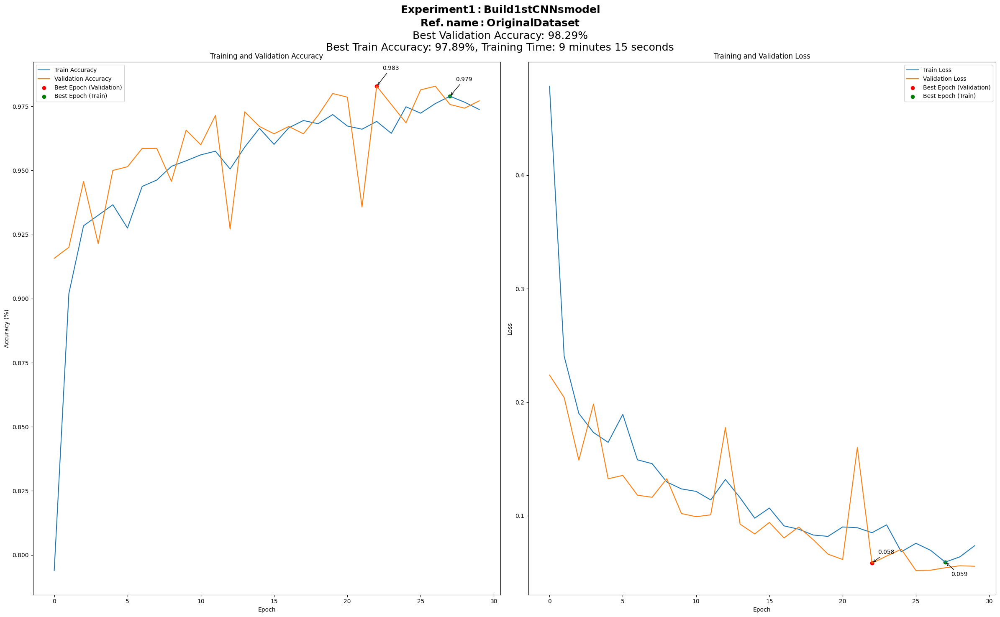

In [40]:
title = 'Experiment 1: Build 1st CNNs model'
get_history(history=history,
            model=model_1st,
            training_time=training_time, 
            title=title, 
            ref_name='Original Dataset')

In [41]:
model_1st.save("tuberculosis.h5")

## Loading Model

In [42]:
from keras.models import load_model
model_1st = load_model('tuberculosis.h5')

# 5. Evaluation

In [43]:
import json
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, accuracy_score, roc_curve, roc_auc_score, f1_score

In [44]:
def evaluate(estimator_name, estimator, X, y_actual, subset_name, training_time, threshold=None):

        # Model Prediction/Y hat
        y_pred = estimator.predict(
            X) 
        # Handling Output Layer of Activation='sigmoid'
        threshold = threshold if threshold else 0.5
        y_pred_binary = (y_pred > threshold).astype(int).flatten()

        # Calculate ROC curve and AUC score
        fpr, tpr, thresholds = roc_curve(y_actual, y_pred_binary)
        auc_score = roc_auc_score(y_actual, y_pred_binary)
        # Classification Report
        report = classification_report(
            y_actual, y_pred_binary, output_dict=True)
        report_dict = json.loads(json.dumps(report))

        # Extract precision and recall from report_dict
        precision = report_dict['weighted avg']['precision']
        recall = report_dict['weighted avg']['recall']
        accuracy = report_dict['accuracy']
        f1 = report_dict['weighted avg']['f1-score']

        # Confusion Matrix
        cm = confusion_matrix(y_actual, y_pred_binary)
        TP = cm[0][0]
        FP = cm[0][1]
        FN = cm[1][0]
        TN = cm[1][1]
        total_seconds = training_time
        minutes = int(training_time // 60)
        seconds = int(training_time % 60)
        training_time_ = "{} minutes {} seconds".format(minutes, seconds)

        accuracy_train = history.history['accuracy']
        accuracy_val = history.history['val_accuracy']

        performance_info = {
            'Model': estimator_name,
            'accuracy_train': accuracy_train,
            'accuracy_val': accuracy_val,
            'Subset': subset_name,
            'Training time': training_time_,
            'Training in seconds': total_seconds,
            'TP': TP,
            'FP': FP,
            'FN': FN,
            'TN': TN,
            'Precision': precision,
            'Recall': recall,
            'F1': f1,
            'AUC': auc_score,
            'Accuracy': accuracy,
        }
        return pd.DataFrame([performance_info])

## 5.1 Training set Performance 

In [45]:
evaluate(estimator_name='CNN', 
         estimator=model_1st, 
         X=X_train, 
         y_actual=y_train, 
         subset_name='Training', 
         training_time=training_time
         )

175/175 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step


,Model,accuracy_train,accuracy_val,Subset,Training time,Training in seconds,TP,FP,FN,TN,Precision,Recall,F1,AUC,Accuracy
0,CNN,"[0.7939285635948181, 0.9019643068313599, 0.928...","[0.9157142639160156, 0.9200000166893005, 0.945...",Training,9 minutes 15 seconds,555.874991,2747,53,51,2749,0.981429,0.981429,0.981429,0.981429,0.981429


## 5.2 Test set Performance 

In [46]:
evaluate(estimator_name='CNN', 
         estimator=model_1st, 
         X=X_test, 
         y_actual=y_test, 
         subset_name='Test', 
         training_time=training_time
         )

22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step


,Model,accuracy_train,accuracy_val,Subset,Training time,Training in seconds,TP,FP,FN,TN,Precision,Recall,F1,AUC,Accuracy
0,CNN,"[0.7939285635948181, 0.9019643068313599, 0.928...","[0.9157142639160156, 0.9200000166893005, 0.945...",Test,9 minutes 15 seconds,555.874991,345,5,8,342,0.981464,0.981429,0.981428,0.981429,0.981429


## 5.3. Confusion matrix

In [47]:
def plot_confusion_matrix(y_actual, y_pred, subset_name):
    y_pred_binary = (y_pred > 0.5).astype(int).flatten()
    cm = confusion_matrix(y_actual, y_pred_binary)
    labels = ['Negative', 'Positive']

    # Extract TP, TN, FP, FN
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)  # Sensitivity or True Positive Rate
    specificity = tn / (tn + fp)  # Specificity or True Negative Rate

    plt.figure(figsize=(18, 9))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=labels, yticklabels=labels)



    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - {subset_name}\n'
              f'True Positives: {tp} | True Negatives: {tn}\n'
              f'False Positives: {fp} (Type I error) | False Negatives: {fn} (Type II error)\n'
              f'Sensitivity (True Positive Rate): {sensitivity:.4f} | Specificity (True Negative Rate): {specificity:.4f}',
              loc='center', wrap=True)
    plt.show()

In [48]:
y_pred_test = model_1st.predict(X_test)

22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step


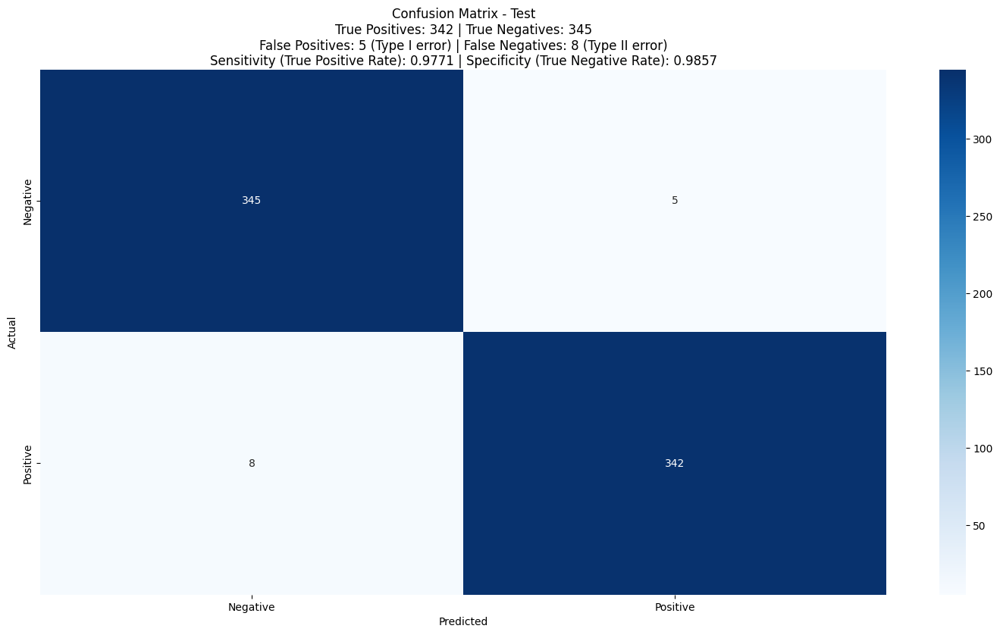

In [49]:
plot_confusion_matrix(y_actual=y_test, 
                      y_pred=y_pred_test, 
                      subset_name='Test')

## 5.4 ROC

In [50]:
def plot_roc(y_actual, y_pred, subset_name):
    fpr, tpr, thresholds = roc_curve(y_actual, y_pred)
    # Print ROC Curve
    plt.figure(figsize=(18, 9))
    plt.plot(fpr, tpr, marker='o', linestyle='-',)
    plt.xlabel('False positive rate (1-Specificity)')
    plt.ylabel('True positive rate (Sensitivity)')
    plt.title(f'ROC Curve - {subset_name}')
    plt.grid()
    plt.show()

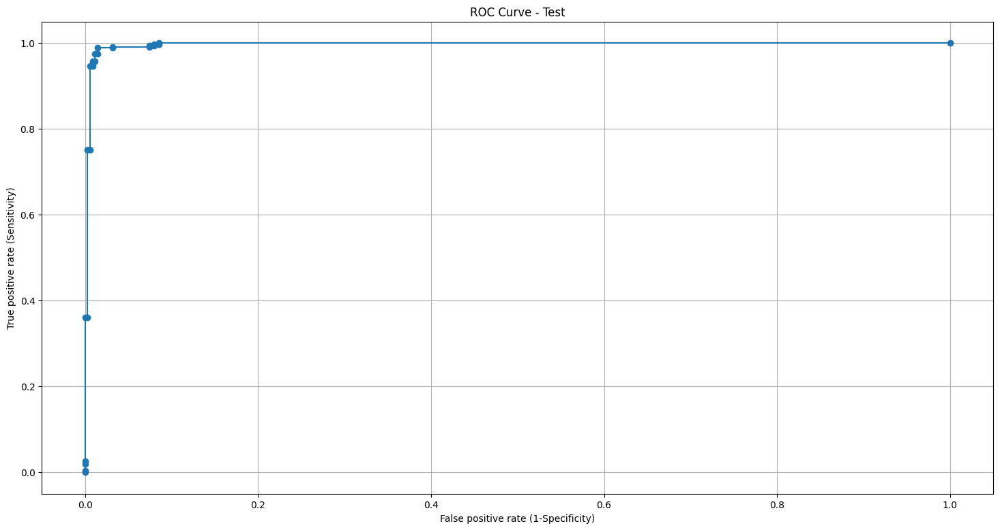

In [51]:
plot_roc(y_actual=y_test, y_pred=y_pred_test, subset_name='Test')

# 6. Model Prediction

In [52]:
def compare_actual_and_predicted_xray(estimator, images, target, title, num_display=16, num_cols=4, random_mode=False):
    '''
    Compare Actual X-ray Images with Model Predictions.

    Parameters:
        estimator: Model used for predictions.
        images (ndarray): Input data as a numpy array.
        target (ndarray): Target data as a numpy array.
        title (str): Title of the plot.
        num_display (int, optional): Number of images to display. Default is 16.
        num_cols (int, optional): Number of columns in the plot. Default is 4.
        random_mode (bool, optional): If True, display images randomly. If False, display the first num_display images. Default is False.

    Returns:
        None

    This function generates a visual comparison between actual X-ray images and their corresponding model predictions. It displays a grid of images with labels to show whether the model's predictions match the actual target values. The grid is organized in rows and columns based on the specified parameters.

    The function does not return any values; it displays the comparison plot directly.
    '''

    n_cols = min(num_cols, num_display)
    n_rows = int(np.ceil(num_display / n_cols))

    title = r'$\bf{' + "Actual-Image" + '}$' + " vs " + \
        r'$\bf{' + "Model-Prediction" + '}$'
    y_hat = estimator.predict(images)
    prediction = (y_hat > 0.5).astype(int).flatten()

    n_images = min(num_display, len(images))
    if random_mode:
        random_indices = np.random.choice(
            len(images), num_display, replace=False)
    else:
        random_indices = np.arange(num_display)

    fig, axes = plt.subplots(
        nrows=n_rows, ncols=n_cols, figsize=(20, 4*n_rows))
    for i, ax in enumerate(axes.flatten()):
        if i >= n_images:  # Check if the index exceeds the available number of images
            break
        # Incase (Did PCA)
        index = random_indices[i]
        if len(images.shape) == 2:
            image = images[index].reshape((128, 128)).astype(int)
        else:
            image = images[index]
        actual_label = target[index]
        model_pred_label = prediction[index]
        model_prob = '{:.3f}'.format(float(y_hat[index]))
        ax.imshow(
            image, cmap='gray' if actual_label == model_pred_label else 'OrRd')
        ax.set_title(
            f"Actual: {actual_label},\nModel Prediction: {model_pred_label}\nProbability: {model_prob}")
    plt.suptitle(f"{title} (Displaying {num_display} Images)",
                 fontsize=16, fontweight='bold')

    fig.set_facecolor('white')
    plt.tight_layout()  
    plt.show()

22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step


/tmp/ipykernel_17/3720167649.py:50: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  model_prob = '{:.3f}'.format(float(y_hat[index]))


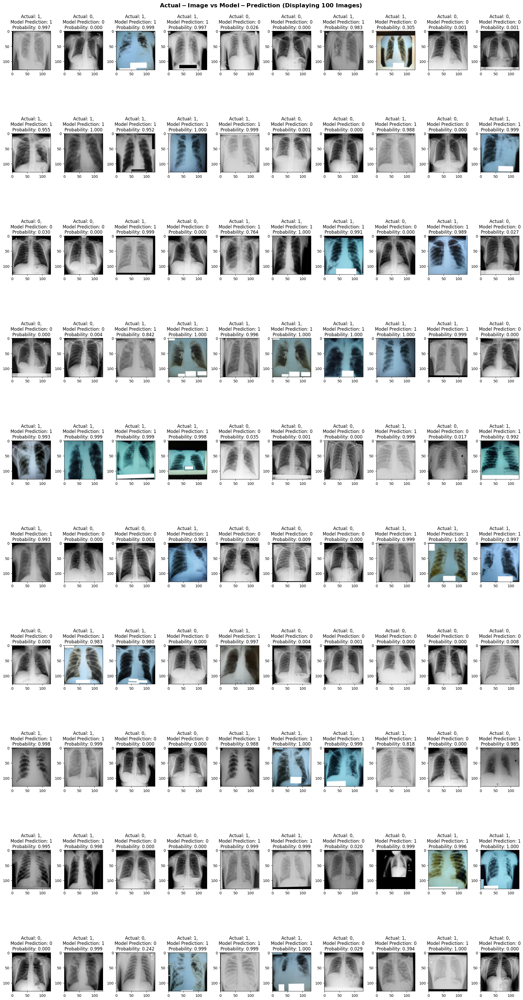

In [53]:
compare_actual_and_predicted_xray(
                estimator=model_1st,
                images=X_test,
                target=y_test, 
                title=None,
                num_display=100,
                num_cols=10, 
                random_mode=True)